In [1]:
pip install git+https://github.com/uremes/elfi@extend_model

Defaulting to user installation because normal site-packages is not writeable
  Cloning https://github.com/uremes/elfi (to revision extend_model) to /run/nvme/job_24277463/tmp/pip-req-build-rr7bq7ky
  Running command git clone --filter=blob:none --quiet https://github.com/uremes/elfi /run/nvme/job_24277463/tmp/pip-req-build-rr7bq7ky
  Running command git checkout -b extend_model --track origin/extend_model
  Switched to a new branch 'extend_model'
  branch 'extend_model' set up to track 'origin/extend_model'.
  Resolved https://github.com/uremes/elfi to commit 3b72621f57fb69b13053506942c20fcddda16963
  Preparing metadata (setup.py) ... done
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install graphviz

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [3]:
import elfi

In [4]:
import graphviz

In [5]:
import simulator

In [6]:
import numpy as np
import matplotlib.pyplot as plt

In [7]:
seed = 20170530
np.random.seed(seed)

In [8]:
pdic, t_samples, D = simulator.load()

In [9]:
pdic

{'p': 4.5887449031309435,
 'beta': 2.814077673370424e-06,
 'gamma': 0.5,
 'prna': 1071.519305237606,
 'tauE': 7,
 'tauI': 41,
 'nE': 60,
 'nI': 60,
 'c': 0.0573,
 'crna': 0.001,
 'Nx': 1900000.0,
 'S': 10.0,
 'Nxassay': 100000.0,
 'Vinoc': 0.05,
 'Vvir': 5.236e-16,
 'MOIsc': 3.0,
 'V0pr': 1000000.0,
 'V0mc': 61.65950018614822,
 'V0scrna': 9332543007.969925,
 'V0prrna': 5754399.373371567,
 'V0mcrna': 10471.285480508985,
 'sigma_MC_RNA': 0.258,
 'sigma_SC_RNA': 0.237,
 'frinse': 0.95,
 'lim': 1.494}

In [10]:
test_output = simulator.run(pdic, t_samples, D)

In [11]:
def meanfield_simulator(gamma, p, beta, prna, tauE, tauI, setup, batch_size=1, random_state=None):

    pdic, t_samples, D = setup  # base params, sample times, dilutions

    pdic_para={'gamma': 10**gamma, 'p': 10**p, 'beta': 10**beta, 'prna': 10**prna, 'tauE': tauE, 'tauI': tauI}
    pdic.update(pdic_para)

    list_output = simulator.run(pdic, t_samples, D)
    return list_output

using original muitiple data here

In [12]:
base = 'psimon-sH1N1/sH1N1_'
obs_dat_MC_ED = np.loadtxt(base+'MC_ED.dat')
obs_dat_MC_RNA = np.loadtxt(base+'MC_RNA.dat')
obs_dat_SC_ED = np.loadtxt(base+'SC_ED.dat')
obs_dat_SC_RNA = np.loadtxt(base+'SC_RNA.dat')
obs_dat_multi = obs_dat_MC_ED, obs_dat_MC_RNA, obs_dat_SC_ED, obs_dat_SC_RNA # the original multi sample experimental data

In [13]:
times_MC_ED, counts_MC_ED = np.unique(obs_dat_MC_ED[:, 0], return_counts=True)
times_SC_ED, counts_SC_ED = np.unique(obs_dat_SC_ED[:, 0], return_counts=True)

In [14]:
times_MC_RNA, counts_MC_RNA = np.unique(obs_dat_MC_RNA[:, 0], return_counts=True)
times_SC_RNA, counts_SC_RNA = np.unique(obs_dat_SC_RNA[:, 0], return_counts=True)

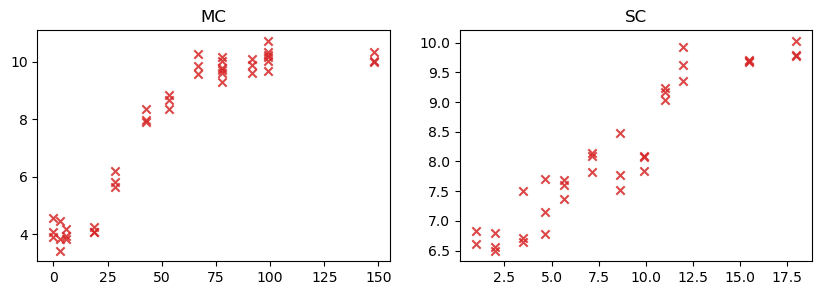

In [15]:
f, ax = plt.subplots(1, 2, figsize=(10,3))
ax[0].scatter(obs_dat_multi[1][:, 0], np.log10(obs_dat_multi[1][:, 1]), color='C3', alpha=0.85, marker='x')
ax[1].scatter(obs_dat_multi[3][:, 0], np.log10(obs_dat_multi[3][:, 1]), color='C3', alpha=0.85, marker='x')
ax[0].set_title('MC')
ax[1].set_title('SC');

create multi simulator

In [16]:
def meanfield_simulator_multi(gamma, p, beta, prna, tauE, tauI, setup, counts, fout, batch_size=1, random_state=None):

    pdic, t_samples, D = setup  # base params, sample times, dilutions

    pdic_para={'gamma': 10**gamma, 'p': 10**p, 'beta': 10**beta, 'prna': 10**prna, 'tauE': tauE, 'tauI': tauI}
    pdic.update(pdic_para)

    list_output1 = simulator.run(pdic, t_samples, D)
    list_output2 = simulator.run(pdic, t_samples, D)
    list_output3 = simulator.run(pdic, t_samples, D)
    list_output4 = simulator.run(pdic, t_samples, D)
    list_output5 = simulator.run(pdic, t_samples, D)
    list_output6 = simulator.run(pdic, t_samples, D)

    list_all = [list_output1, list_output2, list_output3, list_output4, list_output5, list_output6]
    # process failed simulations
    failed = np.any([out[0] is None for out in list_all])
    list_all = [out if out[0] is not None else fout for out in list_all]

    #for ED data
    counts_MC_ED, counts_MC_RNA, counts_SC_ED, counts_SC_RNA = counts
    assert(np.all(counts_MC_ED == 3))
    assert(np.all(counts_SC_ED == 3))
    MC_ED_all = [list_output[0] for list_output in list_all[:3]]
    sim_dat_MC_ED_m = np.stack(MC_ED_all).reshape((-1, 17), order='F') # m for 'multi'
    SC_ED_all = [list_output[2] for list_output in list_all[:3]]
    sim_dat_SC_ED_m = np.stack(SC_ED_all).reshape((-1, 17), order='F')

    #for RNA data
    MC_RNA_all = [[list_output[1][ind] for list_output in list_all[:counts_MC_RNA[ind]]] for ind in range(len(counts_MC_RNA))]
    SC_RNA_all = [[list_output[3][ind] for list_output in list_all[:counts_SC_RNA[ind]]] for ind in range(len(counts_SC_RNA))]
    sim_dat_MC_RNA_m = np.vstack([np.array(MC_RNA).reshape(-1, 2) for MC_RNA in MC_RNA_all])
    sim_dat_SC_RNA_m = np.vstack([np.array(SC_RNA).reshape(-1, 2) for SC_RNA in SC_RNA_all])

    # in the original simultor output, list_ouput = sim_dat_MC_ED, sim_dat_MC_RNA, sim_dat_SC_ED, sim_dat_SC_RNA
    list_output = [sim_dat_MC_ED_m, sim_dat_MC_RNA_m, sim_dat_SC_ED_m, sim_dat_SC_RNA_m, failed]
    return list_output

prior

In [17]:
import operator

In [18]:
bounds = {}
bounds['gamma'] = (-1, 0.5)  
bounds['p'] = (0.5, 3)
bounds['beta'] = (-8, -6)
bounds['prna'] = (2, 4.8)
bounds['tauE'] = (2, 15)
bounds['tauI'] = (2, 55)

In [19]:
m = elfi.ElfiModel(name='MFM')
gamma = elfi.Prior('uniform', bounds['gamma'][0], bounds['gamma'][1]-bounds['gamma'][0], model=m)
beta = elfi.Prior('uniform', bounds['beta'][0], bounds['beta'][1]-bounds['beta'][0], model=m)
tauE=elfi.Prior('uniform', bounds['tauE'][0], bounds['tauE'][1]-bounds['tauE'][0], model=m)
tauI=elfi.Prior('uniform', bounds['tauI'][0], bounds['tauI'][1]-bounds['tauI'][0], model=m)
prna = elfi.Prior('uniform', bounds['prna'][0], bounds['prna'][1]-bounds['prna'][0], model=m)
upper_p = elfi.Operation(np.minimum, prna, bounds['p'][1])  # update upper bound based on prna
scale_p = elfi.Operation(operator.sub, upper_p, bounds['p'][0])  # calculate scale based on lower and upper bounds
p = elfi.Prior('uniform', bounds['p'][0], scale_p)

In [20]:
counts = counts_MC_ED, counts_MC_RNA, counts_SC_ED, counts_SC_RNA

In [21]:
like_MC_ED = np.zeros((len(times_MC_ED), 17))
like_SC_ED = np.zeros((len(times_SC_ED), 17))
like_MC_RNA = np.ones((len(times_MC_RNA), 2))
like_SC_RNA = np.ones((len(times_SC_RNA), 2))
fout_all = [like_MC_ED, like_MC_RNA, like_SC_ED, like_SC_RNA]

important: observed data is defined here.
if we want to use single experimental data, change the observed to "obs_dat_multi" instead of test_output here.

In [22]:
meanfield_sim_vec = elfi.tools.vectorize(meanfield_simulator_multi, dtype=False)
setup = simulator.load()
list_output = elfi.Simulator(meanfield_sim_vec, gamma, p, beta, prna, tauE, tauI, setup, counts, fout_all, observed=[obs_dat_multi]) #changed observed

In [23]:
m.parameter_names

['beta', 'gamma', 'p', 'prna', 'tauE', 'tauI']

In [25]:
def get_MC_ED_data(list_output):
    X = np.array([out[0][:, -8:] for out in list_output])
    return X

def get_MC_RNA_data(list_output):
    X = np.array([out[1][:, 1] for out in list_output])
    return X

def get_SC_ED_data(list_output):
    X = np.array([out[2][:, -8:] for out in list_output])
    return X

def get_SC_RNA_data(list_output):
    X = np.array([out[3][:, 1] for out in list_output])
    return X


s1 = elfi.Summary(get_MC_ED_data, list_output)
s2 = elfi.Summary(get_MC_RNA_data, list_output)
s3 = elfi.Summary(get_SC_ED_data, list_output)
s4 = elfi.Summary(get_SC_RNA_data, list_output)

In [26]:
def get_failed(list_output):
    failed = np.array([out[4] for out in list_output])
    return failed

failed = elfi.Summary(get_failed, list_output)

distance

In [27]:
from functools import partial

In [28]:
def arr_dist(arr, observed, norm=1):
    """L1 distance between simulated and observed array.

    Parameters
    ----------
    arr : np.array size (batch_size, d1, d2)
    observed : tuple (arr, ) where arr is np.array size (1, d1, d2)
    norm : float normalisation constant

    Returns
    -------
    np.array (batch_size,)

    """
    return np.sum(np.abs(arr - observed[0]), axis=(1, 2)) / norm

In [29]:
d1 = elfi.Discrepancy(partial(arr_dist, norm=3*12), s1)
d3 = elfi.Discrepancy(partial(arr_dist, norm=3*12), s3)
c2 = elfi.Summary(np.log10, s2)
c4 = elfi.Summary(np.log10, s4)
d2 = elfi.Distance('euclidean', c2)
d4 = elfi.Distance('euclidean', c4)
d13 = elfi.Operation(operator.add, d1, d3)
d24 = elfi.Operation(operator.add, d2, d4)
d = elfi.Operation(operator.add, d13, d24)

In [30]:
def extract_mean_std(vals, mean, std):
  return (vals - mean)/std

In [31]:
d_norm = elfi.Operation(extract_mean_std, d, 20, 10)

In [32]:
def mask_failures(dist, mask, failed_output=np.inf):
    dist[mask] = failed_output
    return dist

In [33]:
d_masked = elfi.Operation(mask_failures, d_norm, failed)

surrogate model

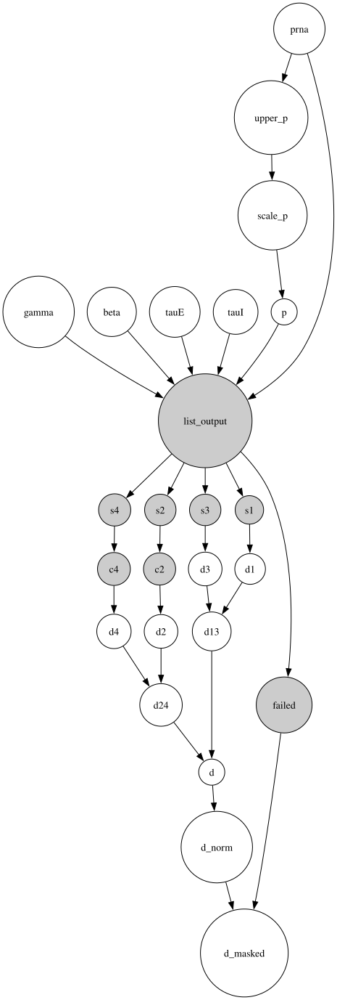

In [34]:
elfi.draw(d)

In [35]:
import GPy

In [36]:
dim = len(m.parameter_names)
kernel = GPy.kern.RBF(input_dim=dim, ARD=True)
# initialise lengthscale parameters and set prior
kernel.lengthscale = 0.2
kernel.lengthscale.set_prior(GPy.priors.Gamma(2, 5), warning=False)
# tauI is expected to have a much larger lengthscale
kernel.lengthscale[[-1]] = 6
kernel.lengthscale[[-1]].set_prior(GPy.priors.Gamma(2, 0.2), warning=False)
kernel = kernel + GPy.kern.Bias(input_dim=dim)

BOLFI with failter detection

In [37]:
 target_model = elfi.RobustGPyRegression(m.parameter_names, bounds=bounds, kernel=kernel.copy(), clf_kernel=kernel.copy(), train_classifier=True, thd=0.1)

In [39]:
prior = elfi.model.extensions.ModelPrior(m)
acq = elfi.methods.bo.acquisition.MaxVar(model=target_model, prior=prior)

In [40]:
bolfi_2 = elfi.BOLFI(d_masked, batch_size=1, initial_evidence=200, update_interval=10, bounds=bounds, acq_noise_var=0.1, seed=seed, target_model=target_model, acquisition_method=acq)

In [41]:
%time post = bolfi_2.fit(n_evidence=1000)

Progress [==================================================] 100.0% Complete
CPU times: user 1h 45min 58s, sys: 11.5 s, total: 1h 46min 9s
Wall time: 1h 47min 2s


 /users/yingying/.local/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning:invalid value encountered in subtract


In [42]:
np.savez('virology_GPmodel_bolfi_n1000_Nov14.npz', X=bolfi_2.target_model.X, Y=bolfi_2.target_model.Y, params=bolfi_2.target_model.instance.param_array)

In [43]:
optim_result = bolfi_2.extract_result()
optim_result.x_min

{'beta': array([-6.95847216]),
 'gamma': array([0.00729811]),
 'p': array([1.41413751]),
 'prna': array([3.30888911]),
 'tauE': array([7.89793947]),
 'tauI': array([19.10933715])}

In [44]:
post.threshold

-0.8477618227941618

check the regression and classifier components:

In [45]:
bolfi_2.target_model._gp

GP_regression.,value,constraints,priors
sum.rbf.variance,0.7916040844329617,+ve,
sum.rbf.lengthscale,"(6,)",+ve,"{Ga(2, 5)} {Ga(2, 0.2)}"
sum.bias.variance,1.4073343954249369,+ve,
Gaussian_noise.variance,0.0024458269060115864,+ve,


In [46]:
bolfi_2.target_model._gp.sum.rbf.lengthscale

index,GP_regression.sum.rbf.lengthscale,constraints,priors
[0],1.06942977,+ve,"Ga(2, 5)"
[1],1.10413149,+ve,"Ga(2, 5)"
[2],1.09918350,+ve,"Ga(2, 5)"
[3],1.70517849,+ve,"Ga(2, 5)"
[4],7.25896444,+ve,"Ga(2, 5)"
[5],32.17151340,+ve,"Ga(2, 0.2)"


In [47]:
bolfi_2.target_model._clf.sum.rbf.lengthscale

index,gp_classification.sum.rbf.lengthscale,constraints,priors
[0],0.89559845,+ve,"Ga(2, 5)"
[1],0.13526165,+ve,"Ga(2, 5)"
[2],2.85984884,+ve,"Ga(2, 5)"
[3],2.84844851,+ve,"Ga(2, 5)"
[4],6.51279933,+ve,"Ga(2, 5)"
[5],70.36151975,+ve,"Ga(2, 0.2)"


plot:

In [49]:
import matplotlib.pyplot as plt

In [71]:
import matplotlib

In [82]:
plt.rcdefaults()

In [83]:
plt.rc('font', size=18) 

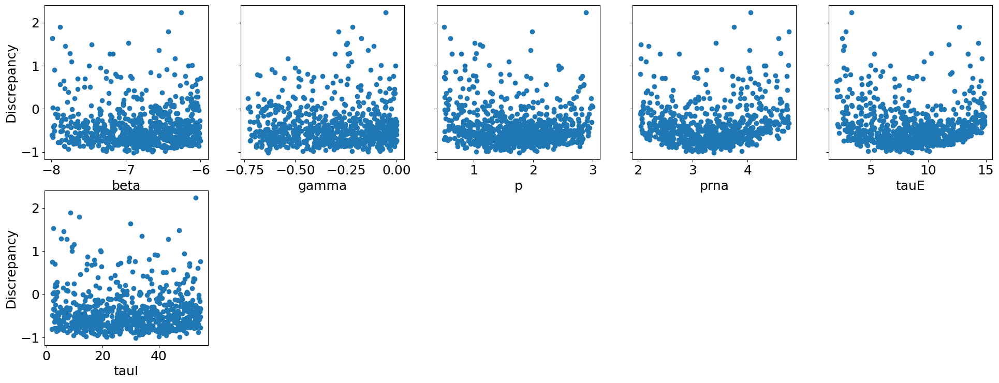

In [84]:
bolfi_2.plot_discrepancy();

In [67]:
plt.rc('font', size=24) 

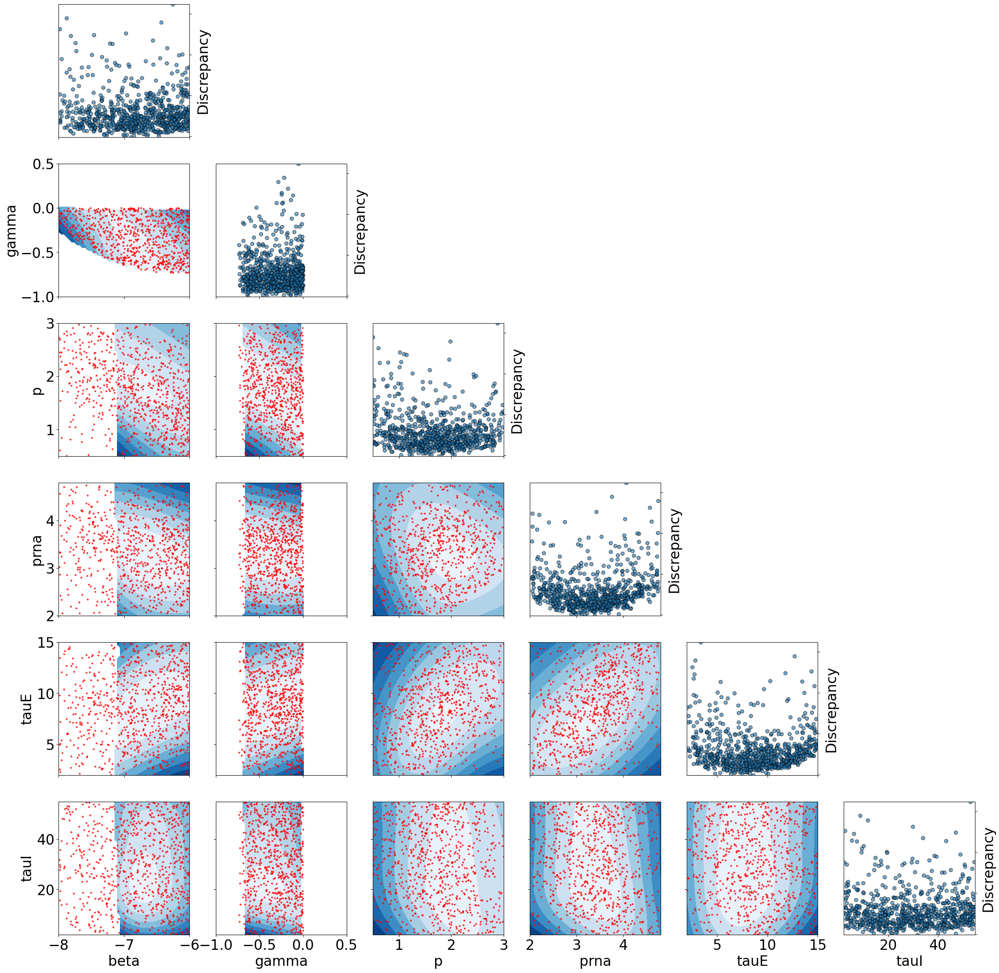

In [68]:
bolfi_2.plot_gp();

In [85]:
def plot_1d_slices(model, cutat, xlim, names=None, plot_data=False):
    dim = xlim.shape[0]
    fig, ax = plt.subplots(1, dim, figsize=(5*dim, 5))
    fixed = [(index, value) for index,value in zip(np.arange(dim), cutat)]
    for active_dim in range(dim):
        not_fixed = fixed.pop(0)
        model.plot(fixed_inputs=fixed, plot_data=plot_data, ax=ax[active_dim])
        ax[active_dim].set_xlim(xlim[active_dim])
        if names is not None: ax[active_dim].set_xlabel(names[active_dim])
        fixed.append(not_fixed)

In [86]:
def plot_2d_slices(func, cutat, xlim, resolution=100, levels=25, names=None, xmin=None, plot_data=None, ax=None):

    dim = xlim.shape[0]
    cutat = np.array(cutat).reshape(1, dim)
    if not ax:
        fig, ax=plt.subplots(dim-1, dim-1, figsize=(5*dim, 5*dim))

    for dim1 in range(dim):
        for dim2 in range(dim1):

            X1, X2 = np.meshgrid(np.linspace(xlim[dim1, 0], xlim[dim1, 1], resolution), np.linspace(xlim[dim2, 0], xlim[dim2, 1], resolution))

            if isinstance(ax, np.ndarray):
                curax=ax[dim2][dim1-1]
            else:
                curax=ax

            xplot = np.tile(cutat, (resolution * resolution, 1))
            xplot[:, dim1] = X1.ravel()
            xplot[:, dim2] = X2.ravel()
            yplot=func(xplot)
            Y=yplot.reshape((resolution,resolution))
            curax.set_xlim((xlim[dim2, 0], xlim[dim2, 1]))
            curax.set_ylim((xlim[dim1, 0], xlim[dim1, 1]))

            # basic model plot
            # note: levels can be int (how many levels) or levels like np.linspace(zmin,zmax,num_levels)

            extend='neither' if np.ndim(levels)==0 else 'both'
            cset=curax.contour(X2,X1,Y,levels,cmap='Blues_r',extend=extend)
            #cset=curax.contourf(X2,X1,Y,levels,cmap='Blues_r',extend=extend)

            # include colorbar if z-axis limits were not fixed:
            if np.ndim(levels)==0: plt.colorbar(cset,ax=curax)

            # some extras

            if names is not None:
                curax.set_xlabel(names[dim2])
                curax.set_ylabel(names[dim1])

            if xmin is not None:
                curax.vlines(xmin[dim2], xlim[dim1,0], xlim[dim1,1], color='k', linestyle='--',zorder=10)
                curax.hlines(xmin[dim1], xlim[dim2,0], xlim[dim2,1], color='k', linestyle='--',zorder=10)

            if plot_data is not None:
                curax.scatter(plot_data[:,dim2],plot_data[:,dim1],zorder=10,color='k',marker='x')

    for dim1 in range(dim-1):
        for dim2 in range(dim1):
            ax[dim1][dim2].set_axis_off()

In [90]:
plt.rc('font', size=22) 

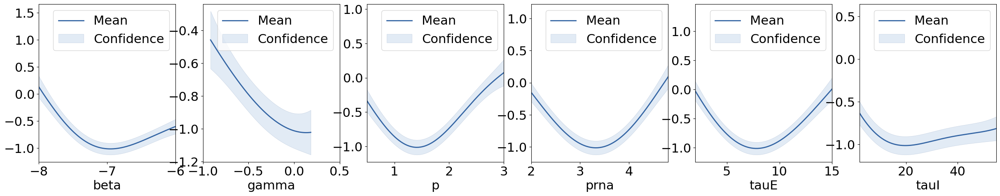

In [91]:
plot_point = [optim_result.x_min[param] for param in bolfi_2.target_model.parameter_names]
xlim = np.array([bounds[name] for name in m.parameter_names])
plot_1d_slices(bolfi_2.target_model.instance, plot_point, xlim, names=m.parameter_names)

In [94]:
pred = lambda x: bolfi_2.target_model._gp.predict(x)[0]

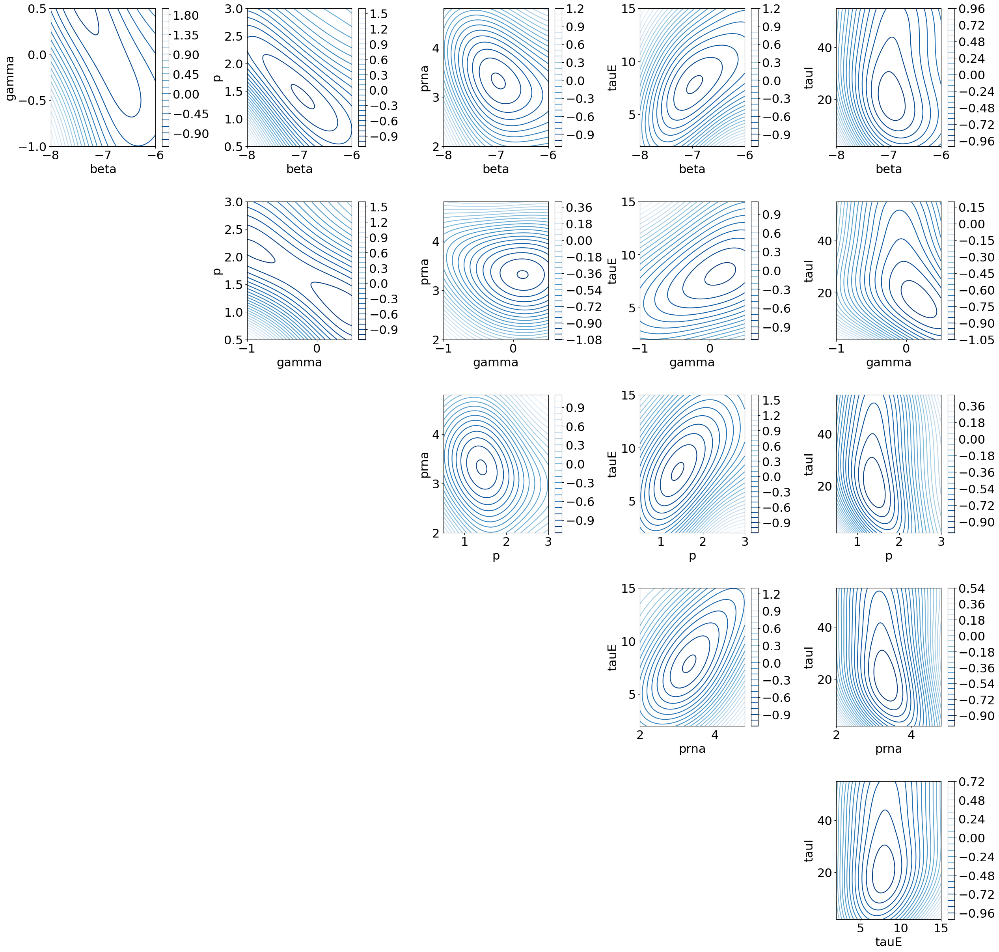

In [110]:
plot_2d_slices(pred, plot_point, xlim, names=m.parameter_names)
plt.subplots_adjust(wspace=0.5, hspace=0.4)

In [112]:
pred = lambda x: bolfi_2.target_model.predict(x)[0]

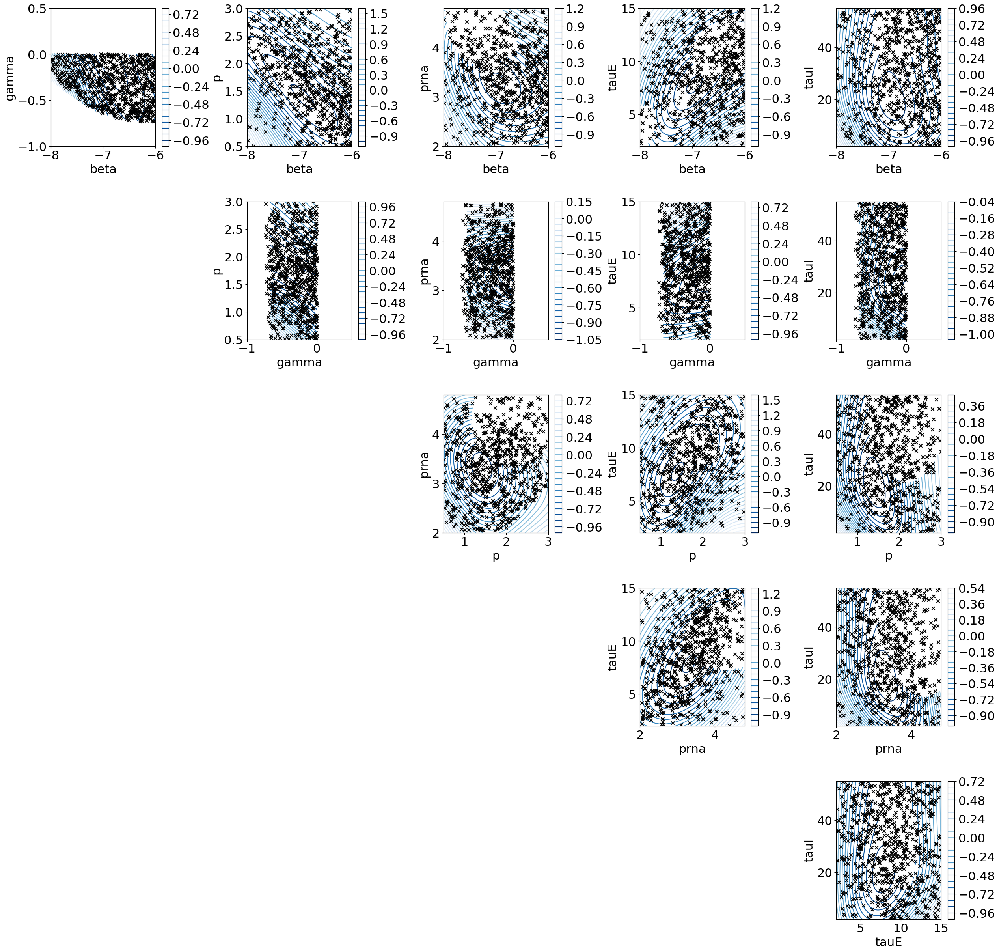

In [113]:
plot_2d_slices(pred, plot_point, xlim, names=m.parameter_names, plot_data=bolfi_2.target_model.X)
plt.subplots_adjust(wspace=0.5, hspace=0.4)

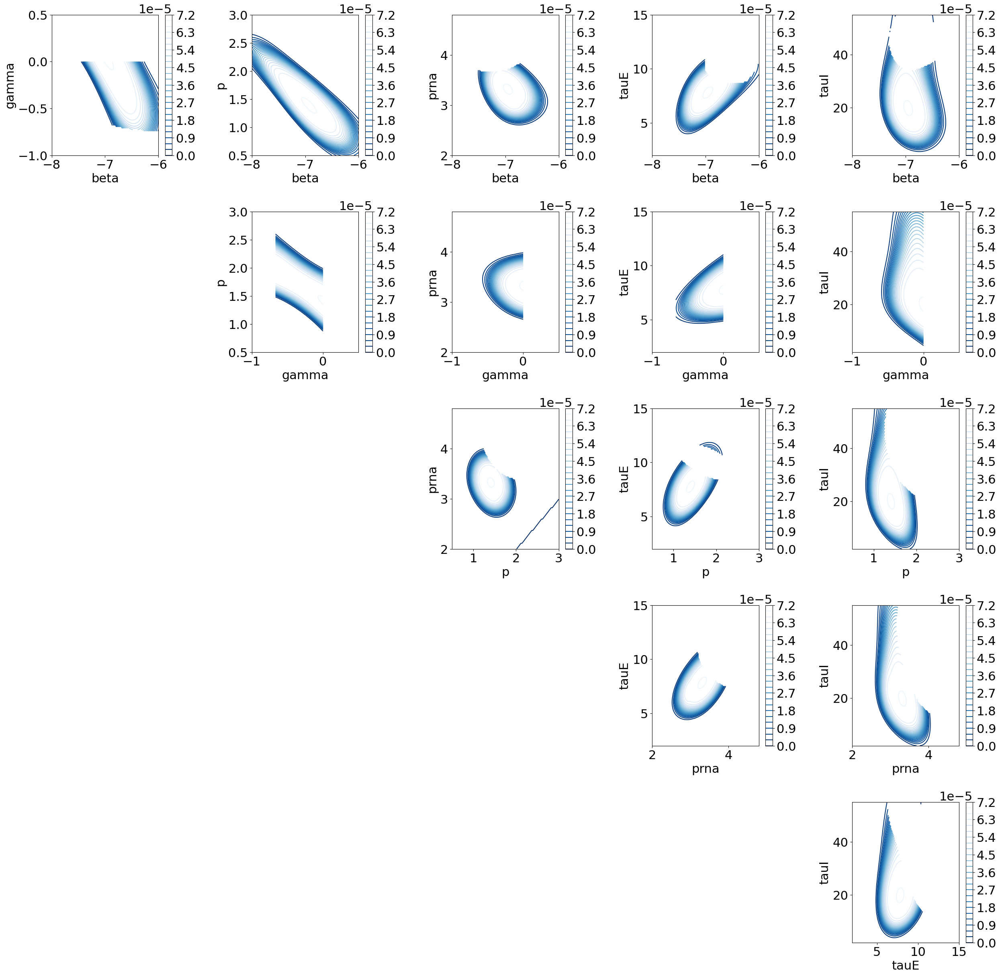

In [117]:
plot_2d_slices(post.pdf, plot_point, xlim, names=m.parameter_names)
plt.subplots_adjust(wspace=0.5, hspace=0.4)

related to failed simulations:

In [119]:
bolfi_2.target_model.n_evidence_all  # num simulations

1000

In [120]:
bolfi_2.target_model.n_evidence  # num simulations that produced output

759

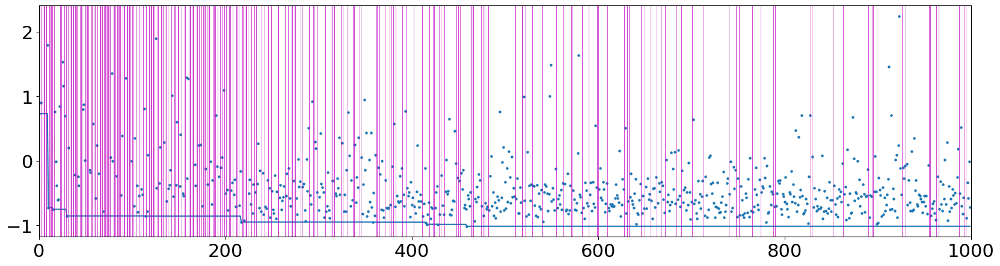

In [121]:
plt.figure(figsize=(20, 5))
plt.plot(np.minimum.accumulate(bolfi_2.target_model.Y_all))
plt.scatter(np.arange(bolfi_2.target_model.n_evidence_all), bolfi_2.target_model.Y_all, s=5)
plt.xlim(0, len(bolfi_2.target_model.Y_all))
for n in range(bolfi_2.target_model.n_evidence_all):
    if not np.isfinite(bolfi_2.target_model.Y_all[n]):
        plt.axvline(n, color='m', linewidth=0.5)

In [123]:
np.sum(np.isfinite(bolfi_2.target_model.Y_all[:100]))

37

posterior sample:

In [128]:
n_sample = 100000
std_dict = {'beta': 0.2, 'gamma': 0.2, 'p': 0.2, 'prna': 0.2, 'tauE': 1, 'tauI': 10}

In [129]:
%time result_BOLFI = bolfi_2.sample(n_sample, algorithm='metropolis', sigma_proposals=std_dict)

4 chains of 100000 iterations acquired. Effective sample size and Rhat for each parameter:
beta 3039.720542443625 1.0011963388536813
gamma 10226.27106476491 1.0007885204262212
p 2636.956305248771 1.001047925572549
prna 2765.8787522279995 1.0008119623605125
tauE 3772.135815808324 1.000263512063809
tauI 5259.059487703349 1.0006640723510034
CPU times: user 25min 29s, sys: 2.27 s, total: 25min 31s
Wall time: 25min 38s


In [130]:
import pickle

In [131]:
# Save the result_BOLFI object to a file
with open("sample_nsample100000_result_bolfi_fail_detecton_multi_euclidean_data_n1000_Nov14.pkl", "wb") as f:
    pickle.dump(result_BOLFI, f)

In [132]:
result_BOLFI

Method: BOLFI
Number of samples: 200000
Number of simulations: 1000
Threshold: -0.848
Parameter                Mean               2.5%              97.5%
beta:                  -6.818             -7.734             -6.094
gamma:                 -0.346             -0.703             -0.006
p:                      1.690              0.850              2.611
prna:                   3.231              2.604              3.961
tauE:                   8.142              4.781             11.472
tauI:                  29.348              5.616             53.241


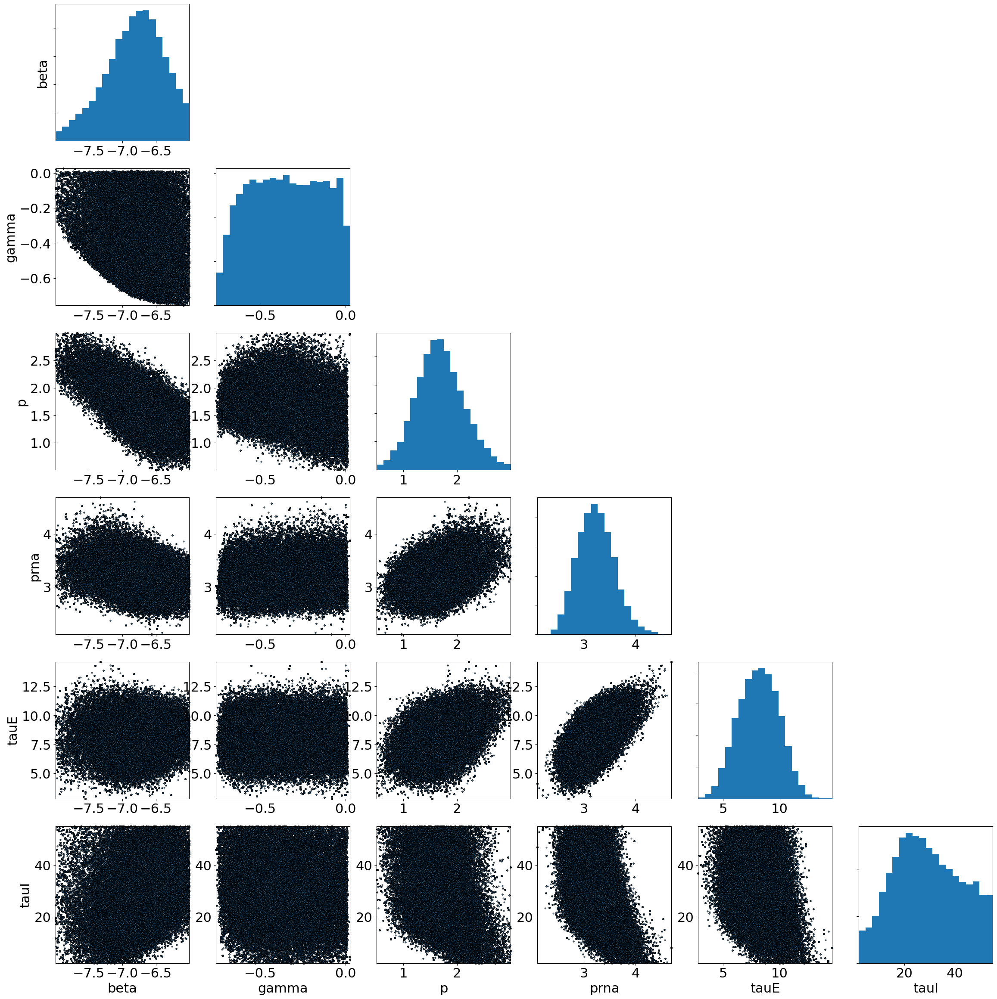

In [133]:
result_BOLFI.plot_pairs();